In [1]:
import pandas as pd
import numpy as np
import nltk
import re

In [2]:
pd.set_option('max_columns', None)

# import csv file 
df_moviedetails = pd.read_csv('export_moviedetails_full_v2.csv', sep=',', encoding='iso-8859-1', escapechar='\\')

# drop duplicate record based movie_url
df_moviedetails.drop_duplicates(subset ="movie_url", keep = False, inplace = True) 

# metascore and world wide gross have lot of missing data, while user rating is complete
# transform the user rating column into GOOD and BAD where GOOD: (>6), BAD: (<=6) 
df_moviedetails['rating-enc'] = np.where(df_moviedetails['user_rating'] >6 , "GOOD", "BAD")


In [3]:
# concatenate movie title and plot summary 
df_moviedetails["title_plot"] = df_moviedetails["movie_title"].astype(str).str.cat(df_moviedetails["plot_summary"].astype(str), sep=' ')

In [4]:
# create dataframe df with subset of columns for text analytics
df = df_moviedetails[["movie_url","movie_title","title_plot","rating-enc"]]

# instead of the default index, extract imdb movie ID from url and set it as index
df["movie_id"] = df["movie_url"].str.split("/").str[-2]
df = df.set_index("movie_id")

# rename key columns' name
df = df.rename(columns={'title_plot': 'text','rating-enc': 'label'})

df.head()


C:\Users\ganfam\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


,movie_url,movie_title,text,label
movie_id,,,,
tt9016974,https://www.imdb.com/title/tt9016974/,Synchronic,Synchronic two new orleans paramedic life rip...,GOOD
tt4154796,https://www.imdb.com/title/tt4154796/,Avengers: Endgame,Avengers: Endgame after devastating event ofa...,GOOD
tt9608818,https://www.imdb.com/title/tt9608818/,The Friend,The Friend after receiving lifealtering news ...,GOOD
tt5363618,https://www.imdb.com/title/tt5363618/,Sound of Metal,Sound of Metal a heavymetal drummer life thro...,GOOD
tt8367814,https://www.imdb.com/title/tt8367814/,The Gentlemen,The Gentlemen an american expat try sell high...,GOOD


In [5]:
# check for null values in df
df.isnull().any()

movie_url      False
movie_title    False
text           False
label          False
dtype: bool

In [7]:
"""
text preprocessing - convert to lower case, remove non-word characters, remove spaces from the start
tokenization, then remove stop words. Then save the processed words back to text field.  
"""

import string
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk import sent_tokenize, word_tokenize

exclude = set(string.punctuation)
stop_words = stopwords.words('english')
newStopWords = ['his', 'like', "she'll", 'than', 'also', 'only', "you're", 'through', 'about', 'themselves', "aren't", 'above', 'after', "that's", 'before', 'com', 'she', "she's", "who's", 'has', 'any', "didn't", "i'd", "we've", 'the', 'other', 'else', 'at', 'down', "here's", 'further', 'there', 'these', 'by', 'get', "they'll", 'no', "where's", "shouldn't", 'then', 'himself', 'hers', 'out', "we'll", 'an', 'should', 'under', "let's", 'what', 'if', "isn't", "he'll", 'or', "shan't", 'too', 'same', 'this', "hasn't", "haven't", 'me', 'had', "they've", 'could', 'all', 'some', 'into', 'he', 'until', 'again', 'http', 'k', "hadn't", "couldn't", "i'll", "we'd", 'between', 'ourselves', "when's", 'for', 'doing', 'nor', 'which', 'our', 'was', 'such', 'very', 'own', 'on', 'being', 'am', 'yours', 'would', 'my', 'once', "they'd", 'how', 'to', 'more', 'theirs', 'did', 'when', "can't", 'www', 'does', 'those', 'both', "mustn't", 'ought', "weren't", 'were', 'therefore', 'here', 'over', 'with', 'it', 'not', "you've", "i'm", 'hence', 'against', "she'd", 'her', 'their', "it's", 'can', 'having', 'of', 'they', 'have', 'in', 'itself', 'just', 'from', "how's", 'i', 'we', 'and', 'shall', 'few', 'since', 'whom', 'while', 'you', 'be', 'yourself', "what's", "you'll", 'but', 'yourselves', 'below', 'herself', "i've", 'why', 'during', "he'd", 'who', 'off', 'otherwise', 'been', 'that', "you'd", 'myself', 'because', 'up', "we're", 'as', "wasn't", 'your', "there's", 'him', 'a', 'ours', 'r', 'ever', 'where', "they're", 'are', 'is', "he's", "don't", "doesn't", 'cannot', 'each', 'its', 'them', 'however', 'so', "why's", 'most', "wouldn't", "won't", 'do']
stop_words.extend(newStopWords)
lemmatizer = WordNetLemmatizer()

for index, row in df.iterrows():
    filter_sentence = ''
    
    # make lowercase, remove punctuation
    sentence = ''.join([ch for ch in str(row['text']).lower() if ch not in exclude]
    # Cleaning the sentence with regex
    sentence = re.sub(r'[^\w\s]', '', sentence)
    # Tokenization
    words = nltk.word_tokenize(sentence)
    # Stopwords removal
    words = [w for w in words if not w in stop_words]
    # Lemmatization
    for words in words:
        filter_sentence = filter_sentence  + ' ' + str(lemmatizer.lemmatize(words))
    
    df.loc[index, 'text'] = filter_sentence

df.head()

,movie_url,movie_title,text,label
movie_id,,,,
tt9016974,https://www.imdb.com/title/tt9016974/,Synchronic,synchronic two new orleans paramedic life rip...,GOOD
tt4154796,https://www.imdb.com/title/tt4154796/,Avengers: Endgame,avenger endgame devastating event ofavengers ...,GOOD
tt9608818,https://www.imdb.com/title/tt9608818/,The Friend,friend receiving lifealtering news couple fin...,GOOD
tt5363618,https://www.imdb.com/title/tt5363618/,Sound of Metal,sound metal heavymetal drummer life thrown fr...,GOOD
tt8367814,https://www.imdb.com/title/tt8367814/,The Gentlemen,gentleman american expat try sell highly prof...,GOOD


In [8]:
# export df to csv 
df.to_csv (r'movie_title_plots.csv', encoding='utf-8-sig', index = False, header=True)

In [9]:
# split train and test datasets by 70/30 before the following word representation process

from sklearn.model_selection import train_test_split

#separate text and label 
y = df.label
# Drop the `label` column
df.drop("label", axis=1)

# Make training and test sets 
X_train, X_test, y_train, y_test = train_test_split(df['text'], y, test_size=0.33, random_state=53)

In [10]:
"""
In this and next 5 cells, transform the train and test set into WoC and TFIDF
"""


from sklearn.feature_extraction.text import (CountVectorizer, 
                                             TfidfVectorizer,
                                             TfidfTransformer)


count_vectorizer = CountVectorizer()
# Fit and transform the training data 
count_train = count_vectorizer.fit_transform(X_train) 
# Transform the test set 
count_test = count_vectorizer.transform(X_test)


# Initialize the `tfidf_vectorizer` 
tfidf_vectorizer = TfidfVectorizer(max_df=0.7) 
# Fit and transform the training data 
tfidf_train = tfidf_vectorizer.fit_transform(X_train) 
# Transform the test set 
tfidf_test = tfidf_vectorizer.transform(X_test)

In [11]:
# Get the feature names of `tfidf_vectorizer` 
print(tfidf_vectorizer.get_feature_names()[-10:])

# Get the feature names of `count_vectorizer` 
print(count_vectorizer.get_feature_names()[:10])

['ãngeles', 'ãocuklar', 'ãperdument', 'ãpoque', 'ãrbol', 'ãrestir', 'ãteki', 'ãµigus', 'ã¼berelite', 'ã¾ig']
['00s', '03', '0445', '10', '100', '10000', '100th', '10th', '10year', '10yearold']


In [12]:
count_df = pd.DataFrame(count_train.A, columns=count_vectorizer.get_feature_names())
tfidf_df = pd.DataFrame(tfidf_train.A, columns=tfidf_vectorizer.get_feature_names())
difference = set(count_df.columns) - set(tfidf_df.columns)
difference

set()

In [13]:
print(count_df.equals(tfidf_df))

False


In [14]:
count_df.head()

,00s,03,0445,10,100,10000,100th,10th,10year,10yearold,11,119,11yearold,12,120,1206,122,12th,12yearold,13,13th,13yearold,14,140,14000yearold,14th,14yearold,15,1557,15day,15th,15yearold,16,160km,1630s,1636,1657,16th,16year,16yearold,16yearoldjohn,17,1700,1725,17th,17year,17yearold,18,180,1800s,1805,1812,1819,1820,1820s,1855,1857,1860s,1870,1870s,1872,1880s,1882,1887,1888,1890s,1892,1894,18th,18yearold,19,1900s,1905,1910,1912,19121989,1915,1918,1919,1920,1920s,1921,1922,1930s,1933,1936,1936s,1939,1939georg,1940,1941,1942,1943,1944,1945,1947dalton,1950,195060s,1950s,1951,1952,1953,1956,1957,1959,1960,1960s,1961,1962,1962s,1963,1966,1967,1968,1969,1970,1970s,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1980s,1981,1982,1983,1984,1985,1986,1987,1989,1990s,1991,1992,1993,1994,1995,1996,1997,1999,19th,19thcentury,19yearold,1br,1st,20,200,2000,200000,2001,2002,2003,2004,2006,20062007,2007,2008,200ton,2010,2011,2011s,2013,2014,2015,2016,2017,2018,2020,2027,2029,2030,2035,2049,2050,2067,20something,20somethings,20th,20year,20yearold,21,2100,211,212,216,21st,21year,22,22yearold,23,2307,24,247,24yearold,25,250,25yearold,26,26yearold,27,28,2nd,2ri,2u,30,30000,3000000,300000000,3022,303,30something,30th,30year,30yearold,32,34,35,36hour,37,38,3d,3yearold,40,400,40th,40year,40years,42,43,440,451,47,4got10,4th,4x4,4yearold,4âª,50,5000,500000,500person,50yearold,51,52yearold,55,59yearold,5th,60,600,600milelong,60th,63,64,65,666,68,6th,70,70sset,72,7500,7th,7year,7yearold,80,83,85meter,890,8m,8yearold,90,900000,90th,90yearold,911,915,93,94,96,9th,9yearold,a9913,aa,aadai,aamis,aana,aarti,abad,abaddon,abandon,abandoned,abattoir,abbas,abbasid,abbey,abby,abbys,abduct,abducted,abductees,abduction,abductor,abducts,abdul,abel,abelhas,abhimanyu,abiding,abigail,ability,abimanyu,abin,able,abnormal,aboard,abominable,aboriginal,abortion,abound,abroad,abrupt,abruptly,absconds,absence,absent,absolutely,absorb,absurd,abundant,abuse,abused,abusing,abusive,abyss,academia,academic,academy,acceleration,accept,acceptance,accepted,accepts,accident,accidental,accidentally,acclaimed,acclimated,accompanied,accompanies,accompaniment,accomplice,accomplish,accomplished,according,accosted,account,accountability,accountable,accountant,accumulates,accusation,accused,acerbic,acerolaorion,achieve,achievement,achieving,acid,acknowledge,acp,acquaintance,acquire,acquired,acquires,acquitted,acrimony,across,act,acted,acting,action,actionthriller,actionwar,activated,active,activist,activity,actor,actorsanjay,actress,actual,actually,ad,ada,adaline,adam,adanan,adapt,adaptation,adapted,adaption,add,added,adderall,addict,addicted,addiction,addled,adelaide,adhuri,adi,adiã³s,adjust,adjusting,adkins,administered,admire,admired,admirer,admission,admit,admits,admitted,adnan,adolescence,adolescent,adolf,adolfo,adopt,adopted,adoption,adoptive,adopts,adorable,adrenaline,adrian,adriano,adrift,adult,adulthood,advance,advanced,advancing,advantage,advantageous,advent,adventure,adventurefilled,adventurer,adventurous,adversary,advertising,advice,advocacy,aegean,aerial,aeronaut,affair,affected,affecting,affection,afflicted,affliction,affluence,affluent,afford,afghan,afghanistan,afloat,afraid,africa,african,africanamerican,afterburnaftershock,afterdeath,afterlife,aftermath,afternoon,afterparty,afterschool,afterwards,aga,agaci,age,aged,ageing,ageless,agency,agenda,agent,agente,agentturnedstudio,ageold,aggarwal,aggressive,aging,ago,agony,agoraphobic,agree,agreed,agreeing,agreement,agrees,agriculture,agu,ahead,ahgassi,ahlat,ahmed,ahmet,ahora,ai,aid,aid1985,aide,aided,aiding,aigaio,aile,ailes,ailesand,ailing,aim,aimed,aiming,aimlessly,aimy,ainaki,air,aire,airline,airman,airplane,airport,aisa,aisha,aishwarya,aisle,aisne,aiyaary,ajatashatru,ajin,ajji,ajvar,aka,akademia,akademisi,akbar,akimbo,akinjeon,akito,akjilkyungchal,aknyeo,akui,akyã¼rek,al,alabama,alabaster,aladdin,alan,alarm,alarming,alaskan,alaturka,albeit,albert,alberto,albion,album,alchemist,alcohol,alcoholic,alcoholism,alcott,ale,alejandro,alena

In [15]:
tfidf_df.head()

,00s,03,0445,10,100,10000,100th,10th,10year,10yearold,11,119,11yearold,12,120,1206,122,12th,12yearold,13,13th,13yearold,14,140,14000yearold,14th,14yearold,15,1557,15day,15th,15yearold,16,160km,1630s,1636,1657,16th,16year,16yearold,16yearoldjohn,17,1700,1725,17th,17year,17yearold,18,180,1800s,1805,1812,1819,1820,1820s,1855,1857,1860s,1870,1870s,1872,1880s,1882,1887,1888,1890s,1892,1894,18th,18yearold,19,1900s,1905,1910,1912,19121989,1915,1918,1919,1920,1920s,1921,1922,1930s,1933,1936,1936s,1939,1939georg,1940,1941,1942,1943,1944,1945,1947dalton,1950,195060s,1950s,1951,1952,1953,1956,1957,1959,1960,1960s,1961,1962,1962s,1963,1966,1967,1968,1969,1970,1970s,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1980s,1981,1982,1983,1984,1985,1986,1987,1989,1990s,1991,1992,1993,1994,1995,1996,1997,1999,19th,19thcentury,19yearold,1br,1st,20,200,2000,200000,2001,2002,2003,2004,2006,20062007,2007,2008,200ton,2010,2011,2011s,2013,2014,2015,2016,2017,2018,2020,2027,2029,2030,2035,2049,2050,2067,20something,20somethings,20th,20year,20yearold,21,2100,211,212,216,21st,21year,22,22yearold,23,2307,24,247,24yearold,25,250,25yearold,26,26yearold,27,28,2nd,2ri,2u,30,30000,3000000,300000000,3022,303,30something,30th,30year,30yearold,32,34,35,36hour,37,38,3d,3yearold,40,400,40th,40year,40years,42,43,440,451,47,4got10,4th,4x4,4yearold,4âª,50,5000,500000,500person,50yearold,51,52yearold,55,59yearold,5th,60,600,600milelong,60th,63,64,65,666,68,6th,70,70sset,72,7500,7th,7year,7yearold,80,83,85meter,890,8m,8yearold,90,900000,90th,90yearold,911,915,93,94,96,9th,9yearold,a9913,aa,aadai,aamis,aana,aarti,abad,abaddon,abandon,abandoned,abattoir,abbas,abbasid,abbey,abby,abbys,abduct,abducted,abductees,abduction,abductor,abducts,abdul,abel,abelhas,abhimanyu,abiding,abigail,ability,abimanyu,abin,able,abnormal,aboard,abominable,aboriginal,abortion,abound,abroad,abrupt,abruptly,absconds,absence,absent,absolutely,absorb,absurd,abundant,abuse,abused,abusing,abusive,abyss,academia,academic,academy,acceleration,accept,acceptance,accepted,accepts,accident,accidental,accidentally,acclaimed,acclimated,accompanied,accompanies,accompaniment,accomplice,accomplish,accomplished,according,accosted,account,accountability,accountable,accountant,accumulates,accusation,accused,acerbic,acerolaorion,achieve,achievement,achieving,acid,acknowledge,acp,acquaintance,acquire,acquired,acquires,acquitted,acrimony,across,act,acted,acting,action,actionthriller,actionwar,activated,active,activist,activity,actor,actorsanjay,actress,actual,actually,ad,ada,adaline,adam,adanan,adapt,adaptation,adapted,adaption,add,added,adderall,addict,addicted,addiction,addled,adelaide,adhuri,adi,adiã³s,adjust,adjusting,adkins,administered,admire,admired,admirer,admission,admit,admits,admitted,adnan,adolescence,adolescent,adolf,adolfo,adopt,adopted,adoption,adoptive,adopts,adorable,adrenaline,adrian,adriano,adrift,adult,adulthood,advance,advanced,advancing,advantage,advantageous,advent,adventure,adventurefilled,adventurer,adventurous,adversary,advertising,advice,advocacy,aegean,aerial,aeronaut,affair,affected,affecting,affection,afflicted,affliction,affluence,affluent,afford,afghan,afghanistan,afloat,afraid,africa,african,africanamerican,afterburnaftershock,afterdeath,afterlife,aftermath,afternoon,afterparty,afterschool,afterwards,aga,agaci,age,aged,ageing,ageless,agency,agenda,agent,agente,agentturnedstudio,ageold,aggarwal,aggressive,aging,ago,agony,agoraphobic,agree,agreed,agreeing,agreement,agrees,agriculture,agu,ahead,ahgassi,ahlat,ahmed,ahmet,ahora,ai,aid,aid1985,aide,aided,aiding,aigaio,aile,ailes,ailesand,ailing,aim,aimed,aiming,aimlessly,aimy,ainaki,air,aire,airline,airman,airplane,airport,aisa,aisha,aishwarya,aisle,aisne,aiyaary,ajatashatru,ajin,ajji,ajvar,aka,akademia,akademisi,akbar,akimbo,akinjeon,akito,akjilkyungchal,aknyeo,akui,akyã¼rek,al,alabama,alabaster,aladdin,alan,alarm,alarming,alaskan,alaturka,albeit,albert,alberto,albion,album,alchemist,alcohol,alcoholic,alcoholism,alcott,ale,alejandro,alena

In [16]:
"""
In this and next 2 cells, transform the train and test set into Word2vec embeddings
"""

import gensim

# Load pretrained model (since intermediate data is not included, the model cannot be refined with additional data)
embeddings = gensim.models.KeyedVectors.load_word2vec_format('GoogleNews-vectors-negative300.bin.gz', binary=True)

In [17]:
dog = embeddings['dog']
print(dog.shape)
print(dog[:10])

(300,)
[ 0.05126953 -0.02233887 -0.17285156  0.16113281 -0.08447266  0.05737305
  0.05859375 -0.08251953 -0.01538086 -0.06347656]


In [18]:
w2v_train = pd.DataFrame() # creating empty final dataframe
w2v_test = pd.DataFrame()

for doc in X_train: # looping through each document and cleaning it
    temp = pd.DataFrame()  # creating a temporary dataframe(store value for 1st doc & for 2nd doc remove the details of 1st & proced through 2nd and so on..)
    for word in doc.split(' '): # looping through each word of a single document and spliting through space
        try:
            word_vec = embeddings[word] # if word is present in embeddings(goole provides weights associate with words(300)) then proceed
            temp = temp.append(pd.Series(word_vec), ignore_index = True) # if word is present then append it to temporary dataframe
        except:
            pass
    doc_vector = temp.mean() # take the average of each column(w0, w1, w2,........w300)
    w2v_train = w2v_train.append(doc_vector, ignore_index = True) # append each document value to the final dataframe

print(w2v_train.shape)


for doc in X_test: # looping through each document and cleaning it
    temp = pd.DataFrame()  # creating a temporary dataframe(store value for 1st doc & for 2nd doc remove the details of 1st & proced through 2nd and so on..)
    for word in doc.split(' '): # looping through each word of a single document and spliting through space
        try:
            word_vec = embeddings[word] # if word is present in embeddings(goole provides weights associate with words(300)) then proceed
            temp = temp.append(pd.Series(word_vec), ignore_index = True) # if word is present then append it to temporary dataframe
        except:
            pass
    doc_vector = temp.mean() # take the average of each column(w0, w1, w2,........w300)
    w2v_test = w2v_test.append(doc_vector, ignore_index = True) # append each document value to the final dataframe

print(w2v_test.shape)


(3349, 300)
(1650, 300)


In [19]:
"""
this function is to plot confusion matrix
"""

import itertools    
import matplotlib.pyplot as plt
import sklearn.metrics as metrics
from sklearn import svm, datasets
from sklearn.metrics import plot_confusion_matrix


def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    See full source and example: 
    http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html
    
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [20]:
"""
from this cell to next 9 cells, we will train and test the following combination of models and word representation
1. nb x bow, nb x tfidf, nb x w2v
2. lr x bow, lr x tfidf, lr x w2v
3. svm x bow, svm x tfidf, svm x w2v

each combination will generate classification report and 
call the function above to plot confusion matrix
"""


from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn import svm

nb X count accuracy:   0.617
              precision    recall  f1-score   support

         BAD       0.60      0.61      0.61       801
        GOOD       0.63      0.62      0.63       849

    accuracy                           0.62      1650
   macro avg       0.62      0.62      0.62      1650
weighted avg       0.62      0.62      0.62      1650

Confusion matrix, without normalization


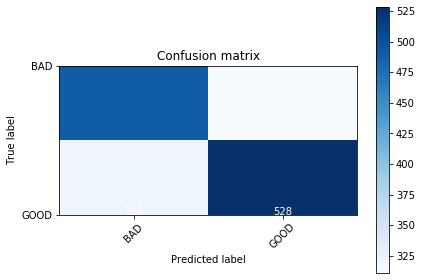

In [21]:
clf = MultinomialNB()
clf.fit(count_train, y_train)
pred = clf.predict(count_test)
score = metrics.accuracy_score(y_test, pred)

print("nb X count accuracy:   %0.3f" % score)
print(metrics.classification_report(y_test, pred, labels=['BAD', 'GOOD']))

cm = metrics.confusion_matrix(y_test, pred, labels=['BAD', 'GOOD'])
plot_confusion_matrix(cm, classes=['BAD', 'GOOD'])

nb X tfidf accuracy:   0.617
              precision    recall  f1-score   support

         BAD       0.64      0.49      0.56       801
        GOOD       0.61      0.73      0.66       849

    accuracy                           0.62      1650
   macro avg       0.62      0.61      0.61      1650
weighted avg       0.62      0.62      0.61      1650

Confusion matrix, without normalization


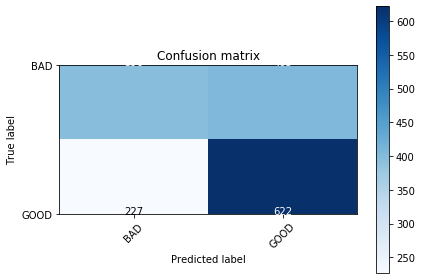

In [22]:
clf = MultinomialNB() 
clf.fit(tfidf_train, y_train)
pred = clf.predict(tfidf_test)
score = metrics.accuracy_score(y_test, pred)

print("nb X tfidf accuracy:   %0.3f" % score)
print(metrics.classification_report(y_test, pred, labels=['BAD', 'GOOD']))

cm = metrics.confusion_matrix(y_test, pred, labels=['BAD', 'GOOD'])
plot_confusion_matrix(cm,classes=['BAD', 'GOOD'])


In [27]:
clf = MultinomialNB() 
clf.fit(w2v_train, y_train)
pred = clf.predict(w2v_test)
score = metrics.accuracy_score(y_test, pred)

print("nb X w2v accuracy:   %0.3f" % score)
print(metrics.classification_report(y_test, pred, labels=['BAD', 'GOOD']))

cm = metrics.confusion_matrix(y_test, pred, labels=['BAD', 'GOOD'])
plot_confusion_matrix(cm,classes=['BAD', 'GOOD'])

ValueError: Negative values in data passed to MultinomialNB (input X)

linear x count accuracy:   0.593
              precision    recall  f1-score   support

         BAD       0.59      0.55      0.57       801
        GOOD       0.60      0.64      0.62       849

    accuracy                           0.59      1650
   macro avg       0.59      0.59      0.59      1650
weighted avg       0.59      0.59      0.59      1650

Confusion matrix, without normalization


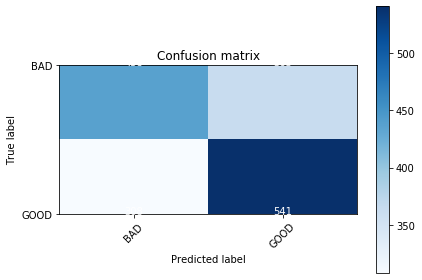

In [23]:
linear_clf = LogisticRegression(solver='liblinear')
linear_clf.fit(count_train, y_train)
pred = linear_clf.predict(count_test)
score = metrics.accuracy_score(y_test, pred)

print("linear x count accuracy:   %0.3f" % score)
print(metrics.classification_report(y_test, pred, labels=['BAD', 'GOOD']))

cm = metrics.confusion_matrix(y_test, pred, labels=['BAD', 'GOOD'])
plot_confusion_matrix(cm, classes=['BAD', 'GOOD'])

linear x tfidf accuracy:   0.611
              precision    recall  f1-score   support

         BAD       0.63      0.48      0.55       801
        GOOD       0.60      0.73      0.66       849

    accuracy                           0.61      1650
   macro avg       0.61      0.61      0.60      1650
weighted avg       0.61      0.61      0.60      1650

Confusion matrix, without normalization


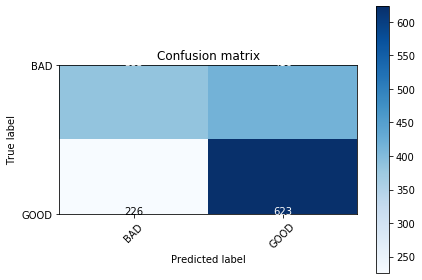

In [24]:
linear_clf = LogisticRegression(solver='liblinear')
linear_clf.fit(tfidf_train, y_train)
pred = linear_clf.predict(tfidf_test)
score = metrics.accuracy_score(y_test, pred)

print("linear x tfidf accuracy:   %0.3f" % score)
print(metrics.classification_report(y_test, pred, labels=['BAD', 'GOOD']))

cm = metrics.confusion_matrix(y_test, pred, labels=['BAD', 'GOOD'])
plot_confusion_matrix(cm, classes=['BAD', 'GOOD'])

linear x w2v accuracy:   0.638
              precision    recall  f1-score   support

         BAD       0.66      0.54      0.59       801
        GOOD       0.63      0.73      0.68       849

    accuracy                           0.64      1650
   macro avg       0.64      0.64      0.63      1650
weighted avg       0.64      0.64      0.63      1650

Confusion matrix, without normalization


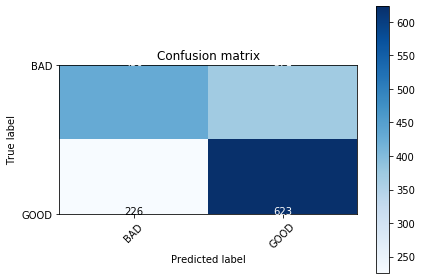

In [25]:
linear_clf = LogisticRegression(solver='liblinear')
linear_clf.fit(w2v_train, y_train)
pred = linear_clf.predict(w2v_test)
score = metrics.accuracy_score(y_test, pred)

print("linear x w2v accuracy:   %0.3f" % score)
print(metrics.classification_report(y_test, pred, labels=['BAD', 'GOOD']))

cm = metrics.confusion_matrix(y_test, pred, labels=['BAD', 'GOOD'])
plot_confusion_matrix(cm, classes=['BAD', 'GOOD'])

svm x count accuracy:   0.607
              precision    recall  f1-score   support

         BAD       0.64      0.43      0.52       801
        GOOD       0.59      0.77      0.67       849

    accuracy                           0.61      1650
   macro avg       0.62      0.60      0.59      1650
weighted avg       0.62      0.61      0.60      1650

Confusion matrix, without normalization


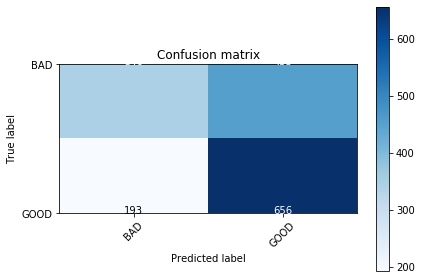

In [26]:
svm_clf = svm.SVC()
svm_clf.fit(count_train, y_train)
pred = svm_clf.predict(count_test)
score = metrics.accuracy_score(y_test, pred)
print("svm x count accuracy:   %0.3f" % score)
print(metrics.classification_report(y_test, pred, labels=['BAD', 'GOOD']))
cm = metrics.confusion_matrix(y_test, pred, labels=['BAD', 'GOOD'])
plot_confusion_matrix(cm, classes=['BAD', 'GOOD'])


svm x tfidf accuracy:   0.617
              precision    recall  f1-score   support

         BAD       0.66      0.43      0.52       801
        GOOD       0.60      0.79      0.68       849

    accuracy                           0.62      1650
   macro avg       0.63      0.61      0.60      1650
weighted avg       0.63      0.62      0.60      1650

Confusion matrix, without normalization


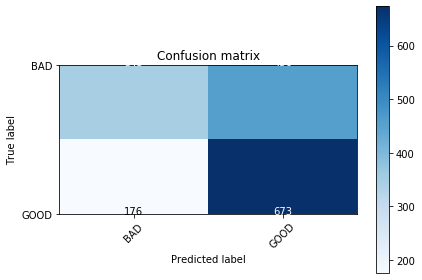

In [27]:
svm_clf = svm.SVC()
svm_clf.fit(tfidf_train, y_train)
pred = svm_clf.predict(tfidf_test)
score = metrics.accuracy_score(y_test, pred)
print("svm x tfidf accuracy:   %0.3f" % score)
print(metrics.classification_report(y_test, pred, labels=['BAD', 'GOOD']))
cm = metrics.confusion_matrix(y_test, pred, labels=['BAD', 'GOOD'])
plot_confusion_matrix(cm, classes=['BAD', 'GOOD'])


svm x w2v accuracy:   0.650
              precision    recall  f1-score   support

         BAD       0.68      0.53      0.59       801
        GOOD       0.63      0.77      0.69       849

    accuracy                           0.65      1650
   macro avg       0.66      0.65      0.64      1650
weighted avg       0.65      0.65      0.64      1650

Confusion matrix, without normalization


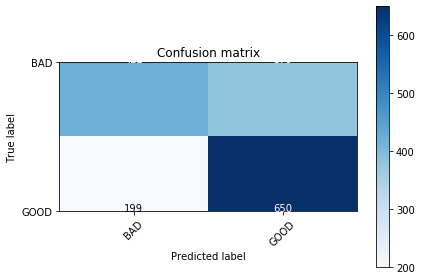

In [28]:
svm_clf = svm.SVC()
svm_clf.fit(w2v_train, y_train)
pred = svm_clf.predict(w2v_test)
score = metrics.accuracy_score(y_test, pred)
print("svm x w2v accuracy:   %0.3f" % score)
print(metrics.classification_report(y_test, pred, labels=['BAD', 'GOOD']))
cm = metrics.confusion_matrix(y_test, pred, labels=['BAD', 'GOOD'])
plot_confusion_matrix(cm, classes=['BAD', 'GOOD'])

# INGNORE THE FOLLOWING CELLS. THE TOPIC MODELLING IS DONE IN ANOTHER NOTEBOOK 

In [61]:
df.reset_index(drop=True, inplace=True)
df.head()

,movie_url,movie_title,text,label
0,https://www.imdb.com/title/tt9016974/,Synchronic,Synchronic two new orleans paramedic life rip...,GOOD
1,https://www.imdb.com/title/tt4154796/,Avengers: Endgame,Avengers: Endgame after devastating event ofa...,GOOD
2,https://www.imdb.com/title/tt9608818/,The Friend,The Friend after receiving lifealtering news ...,GOOD
3,https://www.imdb.com/title/tt5363618/,Sound of Metal,Sound of Metal a heavymetal drummer life thro...,GOOD
4,https://www.imdb.com/title/tt8367814/,The Gentlemen,The Gentlemen an american expat try sell high...,GOOD


In [62]:
df_processed = df

import nltk
import re
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk import sent_tokenize, word_tokenize

stop_words = stopwords.words('english')
newStopWords = ['his', 'like', "she'll", 'than', 'also', 'only', "you're", 'through', 'about', 'themselves', "aren't", 'above', 'after', "that's", 'before', 'com', 'she', "she's", "who's", 'has', 'any', "didn't", "i'd", "we've", 'the', 'other', 'else', 'at', 'down', "here's", 'further', 'there', 'these', 'by', 'get', "they'll", 'no', "where's", "shouldn't", 'then', 'himself', 'hers', 'out', "we'll", 'an', 'should', 'under', "let's", 'what', 'if', "isn't", "he'll", 'or', "shan't", 'too', 'same', 'this', "hasn't", "haven't", 'me', 'had', "they've", 'could', 'all', 'some', 'into', 'he', 'until', 'again', 'http', 'k', "hadn't", "couldn't", "i'll", "we'd", 'between', 'ourselves', "when's", 'for', 'doing', 'nor', 'which', 'our', 'was', 'such', 'very', 'own', 'on', 'being', 'am', 'yours', 'would', 'my', 'once', "they'd", 'how', 'to', 'more', 'theirs', 'did', 'when', "can't", 'www', 'does', 'those', 'both', "mustn't", 'ought', "weren't", 'were', 'therefore', 'here', 'over', 'with', 'it', 'not', "you've", "i'm", 'hence', 'against', "she'd", 'her', 'their', "it's", 'can', 'having', 'of', 'they', 'have', 'in', 'itself', 'just', 'from', "how's", 'i', 'we', 'and', 'shall', 'few', 'since', 'whom', 'while', 'you', 'be', 'yourself', "what's", "you'll", 'but', 'yourselves', 'below', 'herself', "i've", 'why', 'during', "he'd", 'who', 'off', 'otherwise', 'been', 'that', "you'd", 'myself', 'because', 'up', "we're", 'as', "wasn't", 'your', "there's", 'him', 'a', 'ours', 'r', 'ever', 'where', "they're", 'are', 'is', "he's", "don't", "doesn't", 'cannot', 'each', 'its', 'them', 'however', 'so', "why's", 'most', "wouldn't", "won't", 'do']
stop_words.extend(newStopWords)
#lemmatizer = WordNetLemmatizer()
for index, row in df_processed.iterrows():
    filter_sentence = ''
    sentence = str(row['text']).lower()
    # Cleaning the sentence with regex
    sentence = re.sub(r'[^\w\s]', '', sentence)
    # Tokenization
    words = nltk.word_tokenize(sentence)
    # Stopwords removal
    words = [w for w in words if not w in stop_words]
    # Lemmatization
    for words in words:
        filter_sentence = filter_sentence  + ' ' + str(words)
    
    df_processed.loc[index, 'text'] = filter_sentence

In [63]:
df_good = df_processed[df_processed['label']=='GOOD']
df_bad = df_processed[df_processed['label']=='BAD']

In [64]:
print(df_good.shape)
print(df_bad.shape)

(2650, 4)
(2349, 4)


In [65]:
print(df_good.head())
print(df_bad.head())

                               movie_url        movie_title  \
0  https://www.imdb.com/title/tt9016974/         Synchronic   
1  https://www.imdb.com/title/tt4154796/  Avengers: Endgame   
2  https://www.imdb.com/title/tt9608818/         The Friend   
3  https://www.imdb.com/title/tt5363618/     Sound of Metal   
4  https://www.imdb.com/title/tt8367814/      The Gentlemen   

                                                text label  
0   synchronic two new orleans paramedic life rip...  GOOD  
1   avengers endgame devastating event ofavengers...  GOOD  
2   friend receiving lifealtering news couple fin...  GOOD  
3   sound metal heavymetal drummer life thrown fr...  GOOD  
4   gentlemen american expat try sell highly prof...  GOOD  
                                 movie_url                     movie_title  \
9   https://www.imdb.com/title/tt10195452/                   American Skin   
18   https://www.imdb.com/title/tt4126476/                           After   
25   https://www.imdb

In [66]:
X_train = pd.DataFrame(df_good['text'])
#headlines_smaller = X_train.sample(frac = 0.2, random_state= 423)
#headlines_smaller.columns = ['movie_plot']
class WordVecVectorizer(object):
    def __init__(self, word2vec):
        self.word2vec = word2vec
        self.dim = 300
    def fit(self, X, y):
        return self
    def transform(self, X):
        return np.array([
            np.mean([self.word2vec[w] for w in texts.split() if w in self.word2vec]
                    or [np.zeros(self.dim)], axis=0)
            for texts in X
        ])
#representing each headline by the mean of word embeddings for the words used in the headlines.
wtv_vect = WordVecVectorizer(embeddings)
#X_train_wtv = wtv_vect.transform(headlines_smaller.movie_plot)
X_train_wtv = wtv_vect.transform(X_train.text)
print(X_train_wtv.shape)

(2650, 300)


In [67]:
from sklearn.cluster import KMeans
km = KMeans(
    n_clusters=8, init='random',
    n_init=10, max_iter=300, 
    tol=1e-04, random_state=0
)
y_km = km.fit_predict(X_train_wtv)
df_good = pd.DataFrame({'plot_keywords' :X_train.text, 'topic_cluster' :y_km })

In [68]:
df_good

,plot_keywords,topic_cluster
0,synchronic two new orleans paramedic life rip...,5
1,avengers endgame devastating event ofavengers...,4
2,friend receiving lifealtering news couple fin...,6
3,sound metal heavymetal drummer life thrown fr...,6
4,gentlemen american expat try sell highly prof...,7
...,...,...
4992,ãrestir aris teenage lifestyle big city disru...,3
4993,may nai fai rang frer super standard girl sch...,5
4995,anarkali story naval officer fall love gorgeo...,2
4996,la guerre des tuques 3d winter break arrives ...,1


In [73]:
df_bad

,plot_keywords,topic_cluster
9,american skin marine veteran working school j...,3
18,young woman fall guy dark secret two embark r...,5
25,godzilla king monsters cryptozoological agenc...,7
28,cats tribe cat called jellicles must decide y...,4
57,dark phoenix jean grey begin develop incredib...,1
...,...,...
4988,rodeo juliet bigcity girl go country meet spe...,4
4989,anger dead alice mother fight survival virus ...,0
4991,body dance 2 based true story fictitious danc...,5
4994,beeba boys help recent recruit gang leader ta...,3


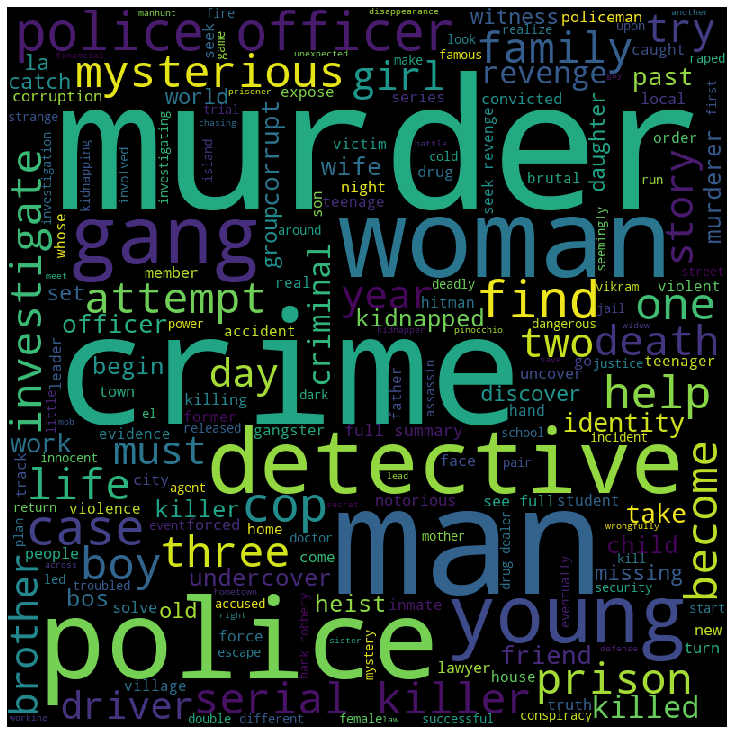

{'murder': 45, 'police': 43, 'crime': 32, 'man': 30, 'officer': 28, 'woman': 24, 'detective': 23, 'killer': 21, 'young': 19, 'gang': 19, 'find': 18, 'case': 17, 'cop': 16, 'revenge': 15, 'boy': 14, 'one': 14, 'mysterious': 14, 'serial': 14, 'help': 14, 'family': 13}


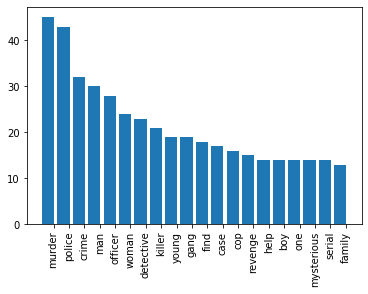

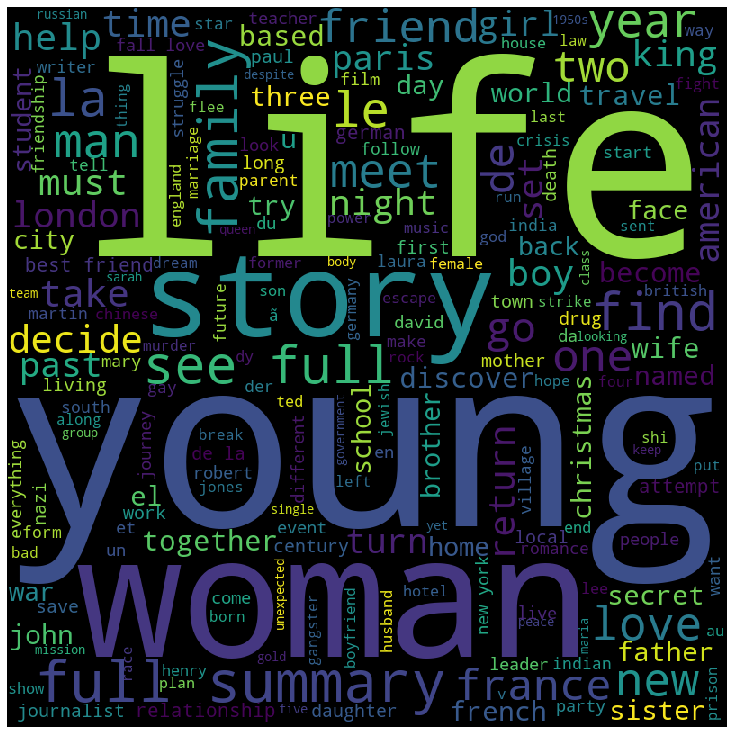

{'life': 51, 'young': 45, 'story': 43, 'woman': 40, 'full': 39, 'summary': 37, 'family': 35, 'la': 34, 'see': 34, 'friend': 33, 'love': 32, 'find': 31, 'de': 30, 'new': 30, 'year': 28, 'man': 25, 'meet': 25, 'le': 23, 'one': 23, 'two': 21}


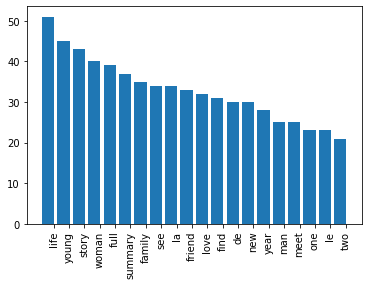

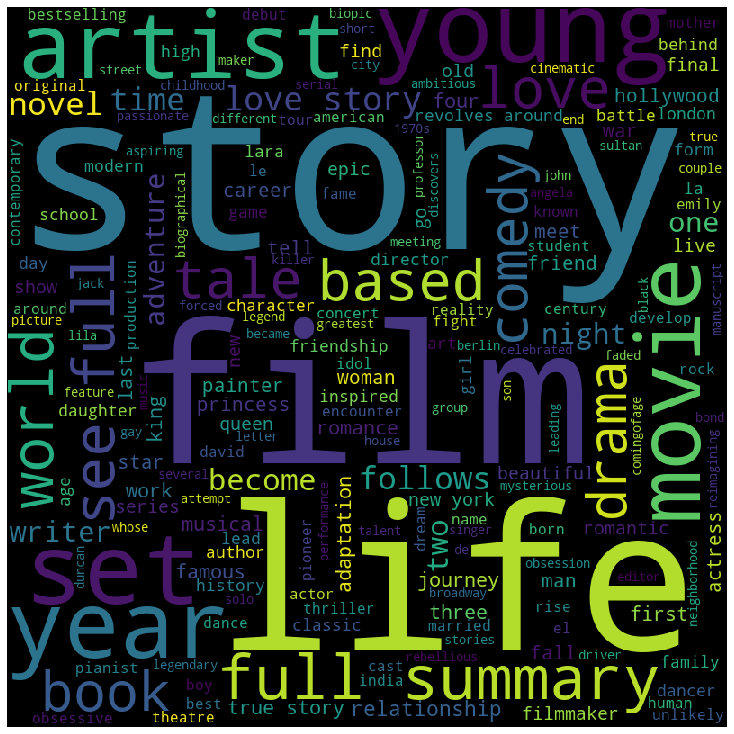

{'story': 77, 'life': 45, 'film': 41, 'love': 25, 'young': 19, 'set': 19, 'full': 17, 'artist': 17, 'year': 16, 'summary': 16, 'world': 15, 'book': 15, 'movie': 15, 'see': 15, 'based': 13, 'comedy': 12, 'drama': 12, 'new': 12, 'true': 11, 'tale': 11}


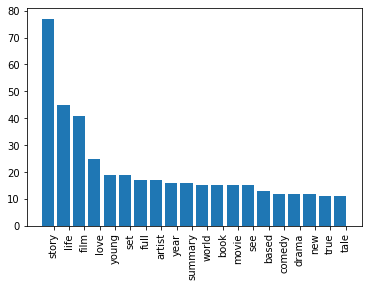

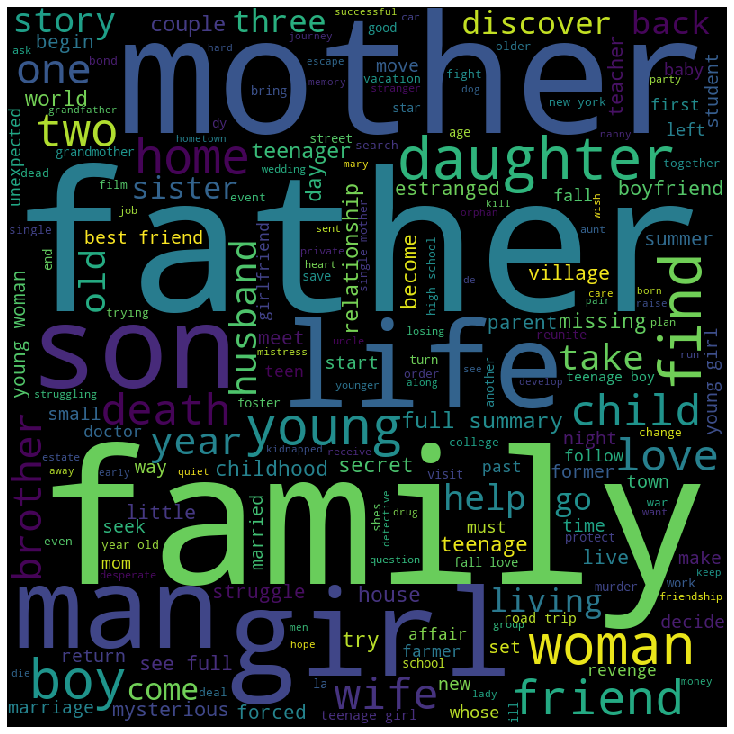

{'girl': 83, 'father': 83, 'family': 78, 'mother': 74, 'young': 70, 'life': 63, 'woman': 63, 'man': 58, 'son': 58, 'boy': 57, 'find': 57, 'daughter': 57, 'friend': 49, 'home': 45, 'love': 40, 'year': 36, 'two': 35, 'teenage': 32, 'wife': 31, 'death': 31}


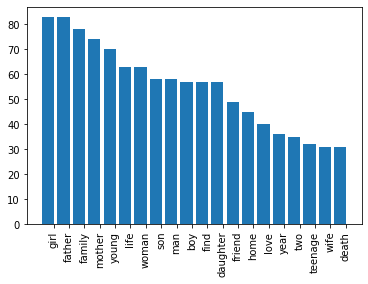

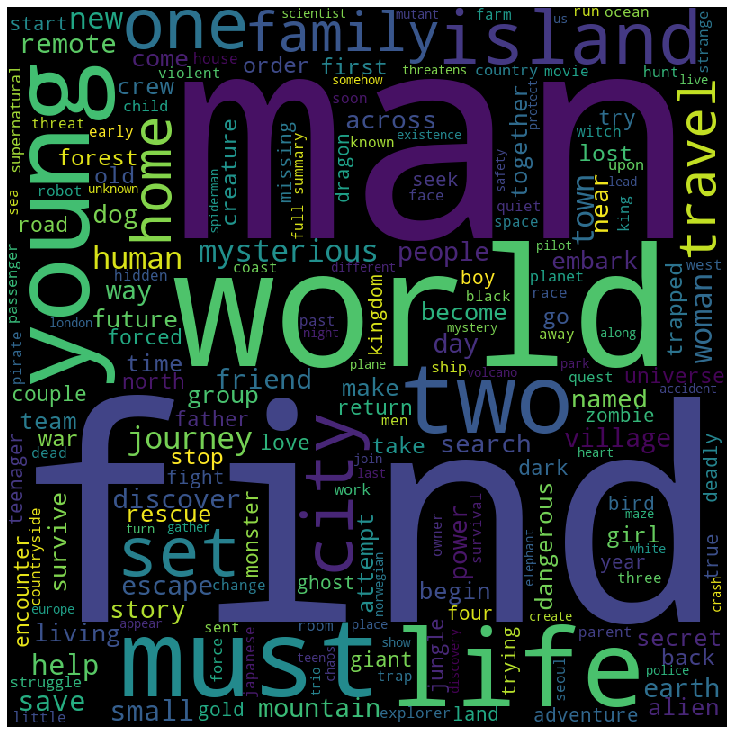

{'find': 32, 'man': 31, 'world': 30, 'new': 26, 'must': 26, 'young': 26, 'life': 26, 'two': 22, 'island': 22, 'one': 21, 'set': 20, 'family': 19, 'city': 19, 'home': 19, 'travel': 17, 'mysterious': 17, 'human': 17, 'woman': 17, 'journey': 17, 'town': 17}


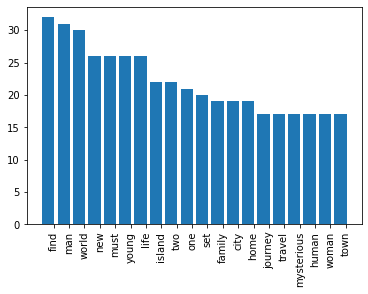

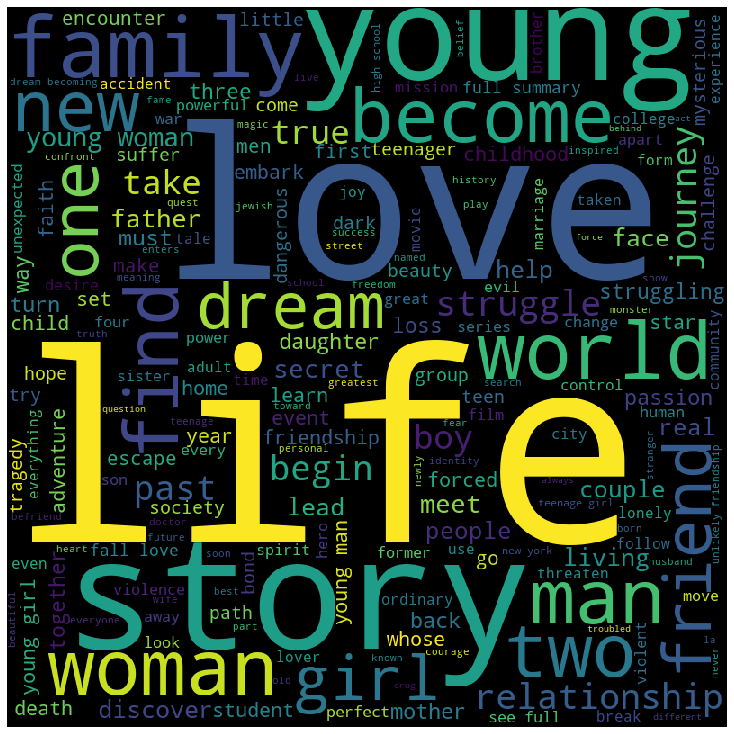

{'life': 135, 'young': 90, 'love': 89, 'story': 55, 'woman': 53, 'man': 45, 'family': 42, 'girl': 38, 'world': 37, 'new': 35, 'two': 32, 'find': 32, 'dream': 27, 'one': 24, 'friend': 24, 'relationship': 20, 'struggle': 20, 'becomes': 20, 'journey': 20, 'begin': 19}


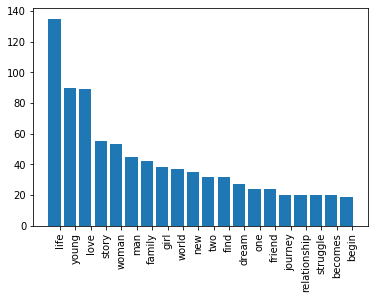

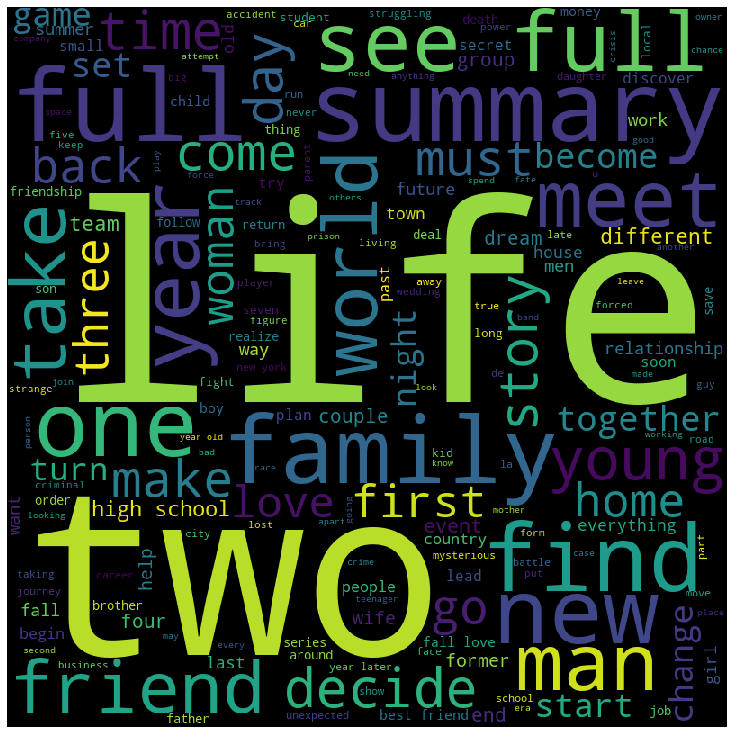

{'life': 104, 'two': 79, 'full': 70, 'year': 67, 'summary': 67, 'new': 63, 'one': 59, 'see': 59, 'family': 58, 'find': 57, 'take': 57, 'friend': 54, 'man': 51, 'meet': 50, 'world': 46, 'young': 42, 'love': 38, 'time': 38, 'school': 37, 'day': 35}


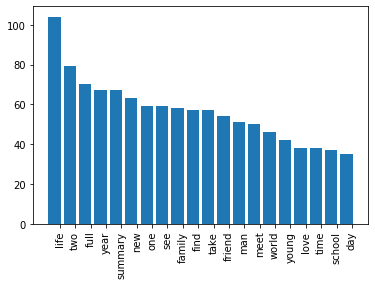

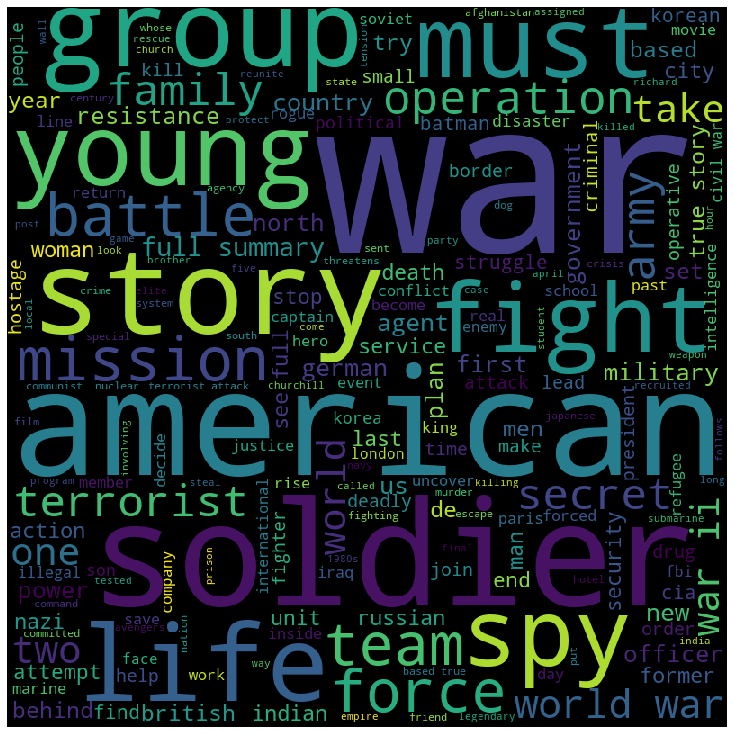

{'war': 59, 'story': 32, 'world': 29, 'american': 26, 'soldier': 22, 'group': 22, 'life': 21, 'terrorist': 20, 'must': 19, 'young': 19, 'true': 17, 'spy': 17, 'fight': 17, 'mission': 17, 'full': 17, 'team': 16, 'battle': 16, 'operation': 16, 'agent': 16, 'army': 16}


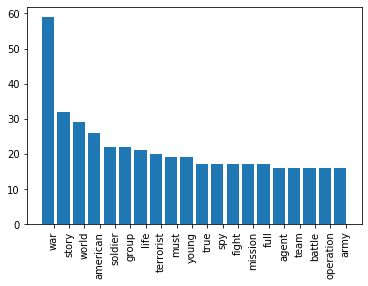

In [74]:
%matplotlib inline
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
from collections import Counter

stop_words = set(STOPWORDS)

for cluster_index in range(0,8):

    key_words = ""

    for index, row in df_good.iterrows():
        if row['topic_cluster'] == cluster_index:
            separate = row['plot_keywords'].split(" ") 
            for j in range(len(separate)): 
                separate[j] = separate[j].strip().lower()     
            key_words += " ".join(separate)+" "
    
    #print(key_words)
        
    # Creating the Word Cloud
    final_wordcloud = WordCloud(width = 800, height = 800, 
                    background_color ='black', 
                    stopwords = stop_words, 
                    min_font_size = 10).generate(key_words)

    # Displaying the WordCloud                    
    plt.figure(figsize = (10, 10), facecolor = None) 
    plt.imshow(final_wordcloud) 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
  
    plt.show()
    
 
    word_list = key_words.split()
    counts = dict(Counter(word_list).most_common(20))
    print(counts)

    labels, values = zip(*counts.items())

    # sort your values in descending order
    indSort = np.argsort(values)[::-1]

    # rearrange your data
    labels = np.array(labels)[indSort]
    values = np.array(values)[indSort]

    indexes = np.arange(len(labels))

    bar_width = 0.35

    plt.bar(indexes, values)

    # add labels
    plt.xticks(indexes + bar_width, labels, rotation='vertical')
    
    plt.show()


In [70]:
X_train = pd.DataFrame(df_bad['text'])
#headlines_smaller = X_train.sample(frac = 0.2, random_state= 423)
#headlines_smaller.columns = ['movie_plot']
class WordVecVectorizer(object):
    def __init__(self, word2vec):
        self.word2vec = word2vec
        self.dim = 300
    def fit(self, X, y):
        return self
    def transform(self, X):
        return np.array([
            np.mean([self.word2vec[w] for w in texts.split() if w in self.word2vec]
                    or [np.zeros(self.dim)], axis=0)
            for texts in X
        ])
#representing each headline by the mean of word embeddings for the words used in the headlines.
wtv_vect = WordVecVectorizer(embeddings)
#X_train_wtv = wtv_vect.transform(headlines_smaller.movie_plot)
X_train_wtv = wtv_vect.transform(X_train.text)
print(X_train_wtv.shape)

(2349, 300)


In [71]:
from sklearn.cluster import KMeans
km = KMeans(
    n_clusters=8, init='random',
    n_init=10, max_iter=300, 
    tol=1e-04, random_state=0
)
y_km = km.fit_predict(X_train_wtv)
df_bad = pd.DataFrame({'plot_keywords' :X_train.text, 'topic_cluster' :y_km })

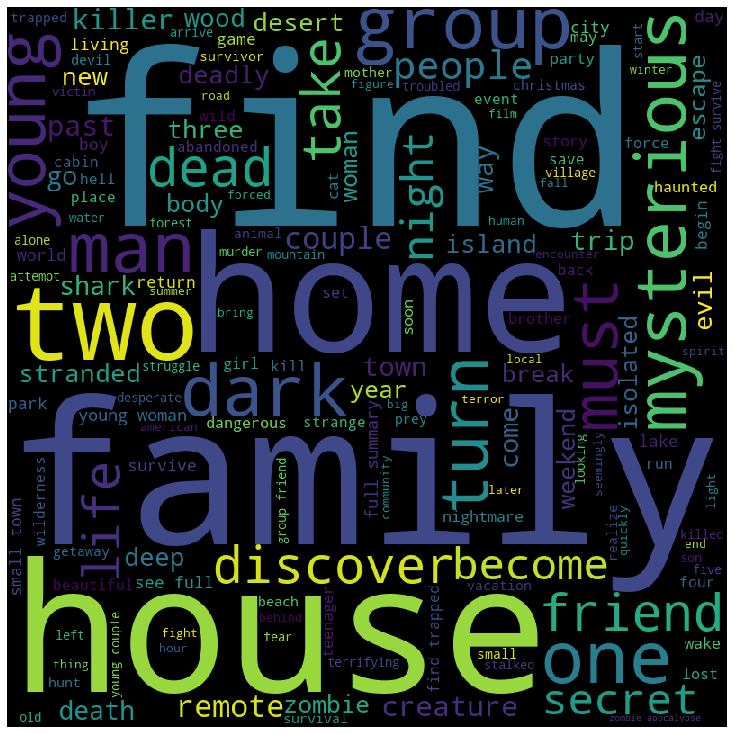

{'find': 59, 'family': 48, 'young': 45, 'house': 39, 'group': 38, 'two': 35, 'one': 34, 'home': 31, 'friend': 30, 'mysterious': 29, 'dark': 29, 'man': 29, 'couple': 26, 'town': 26, 'turn': 26, 'woman': 24, 'must': 24, 'dead': 23, 'take': 23, 'life': 22}


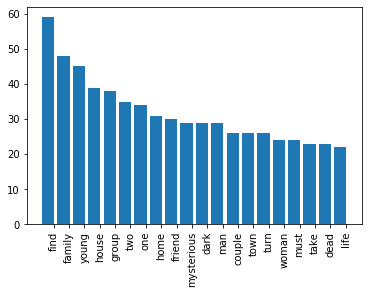

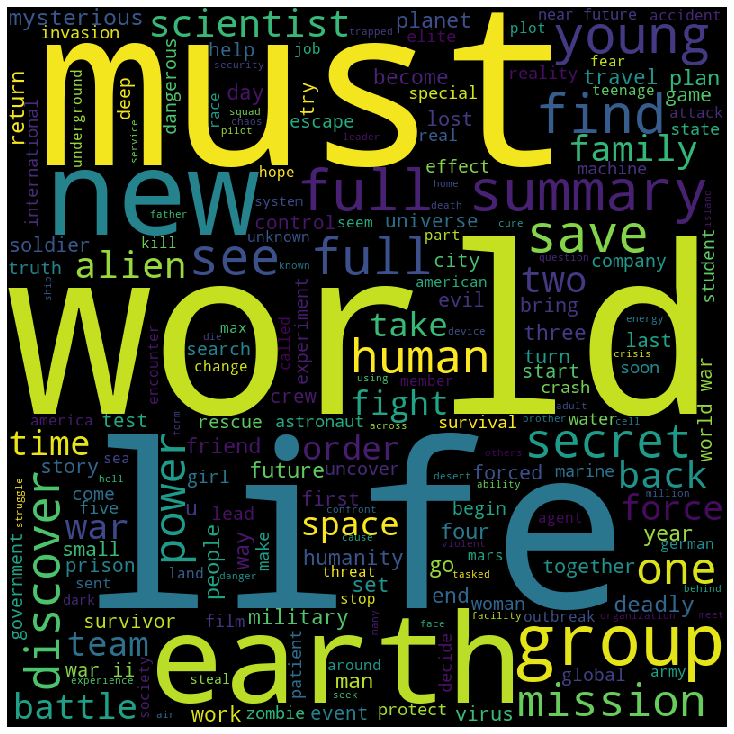

{'world': 54, 'life': 43, 'must': 41, 'earth': 36, 'new': 33, 'war': 33, 'group': 31, 'full': 31, 'summary': 30, 'find': 27, 'see': 26, 'young': 25, 'save': 24, 'human': 22, 'secret': 20, 'future': 19, 'power': 18, 'mission': 18, 'scientist': 18, 'one': 17}


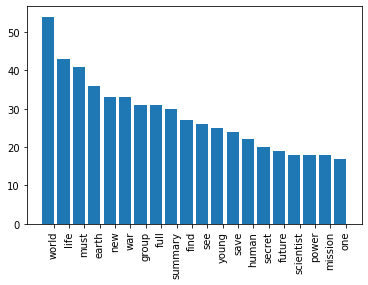

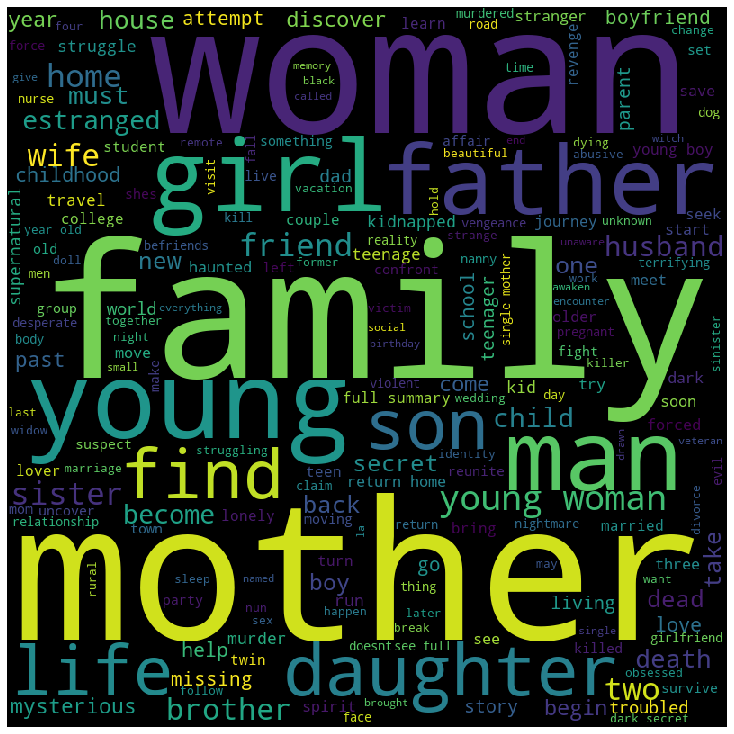

{'young': 97, 'woman': 89, 'mother': 66, 'family': 56, 'girl': 45, 'man': 44, 'father': 44, 'daughter': 40, 'son': 39, 'home': 37, 'life': 37, 'find': 37, 'two': 29, 'sister': 29, 'friend': 28, 'wife': 28, 'brother': 27, 'boy': 24, 'secret': 23, 'husband': 23}


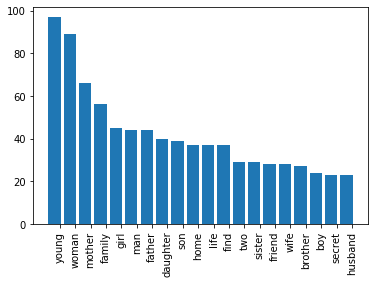

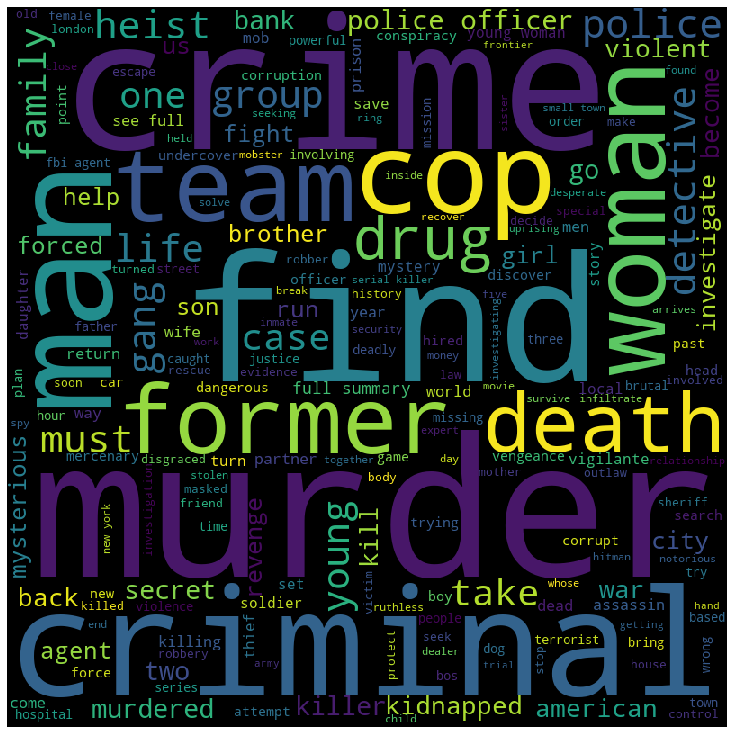

{'murder': 35, 'police': 33, 'find': 32, 'crime': 32, 'criminal': 31, 'woman': 31, 'man': 28, 'cop': 26, 'young': 25, 'officer': 23, 'drug': 23, 'team': 21, 'detective': 21, 'former': 20, 'death': 19, 'take': 18, 'go': 18, 'agent': 18, 'gang': 18, 'must': 17}


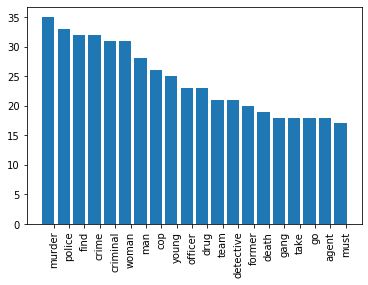

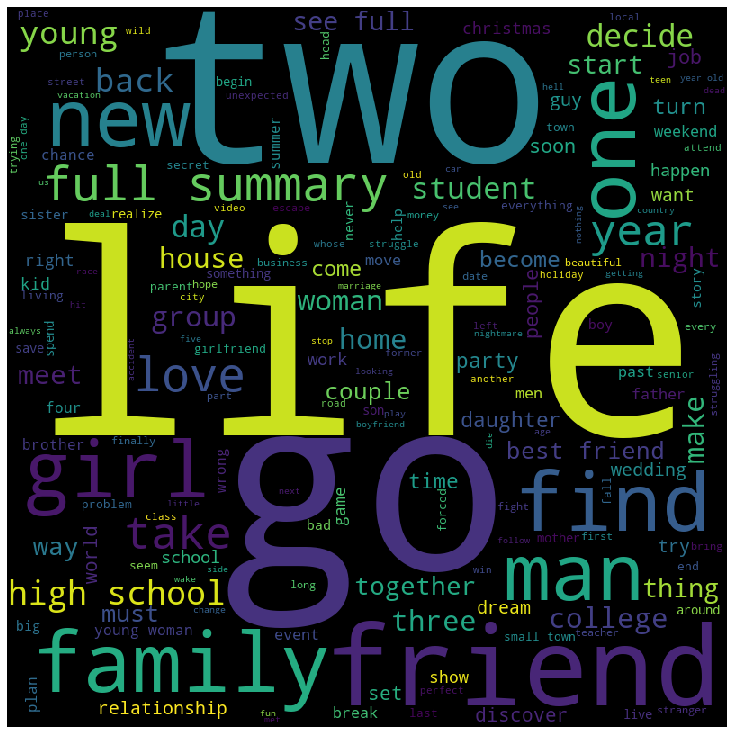

{'life': 86, 'friend': 73, 'go': 71, 'one': 67, 'school': 61, 'young': 57, 'new': 53, 'two': 53, 'family': 50, 'year': 49, 'find': 48, 'full': 46, 'man': 45, 'summary': 45, 'woman': 44, 'love': 43, 'high': 42, 'day': 42, 'take': 41, 'girl': 41}


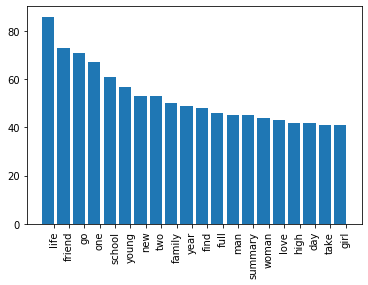

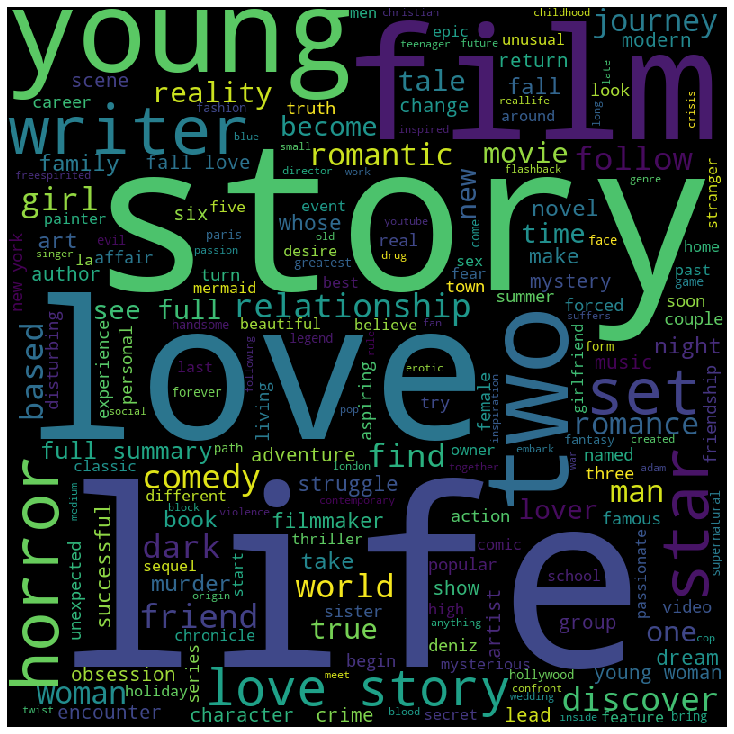

{'life': 53, 'love': 51, 'story': 50, 'young': 24, 'film': 19, 'two': 18, 'woman': 17, 'writer': 17, 'star': 16, 'horror': 16, 'set': 15, 'new': 15, 'fall': 14, 'relationship': 13, 'comedy': 13, 'dark': 12, 'based': 12, 'world': 12, 'find': 12, 'friend': 12}


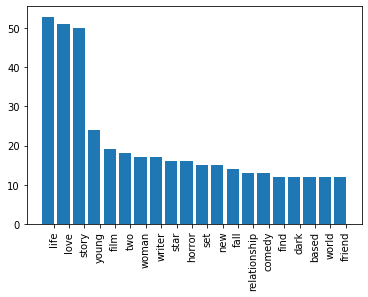

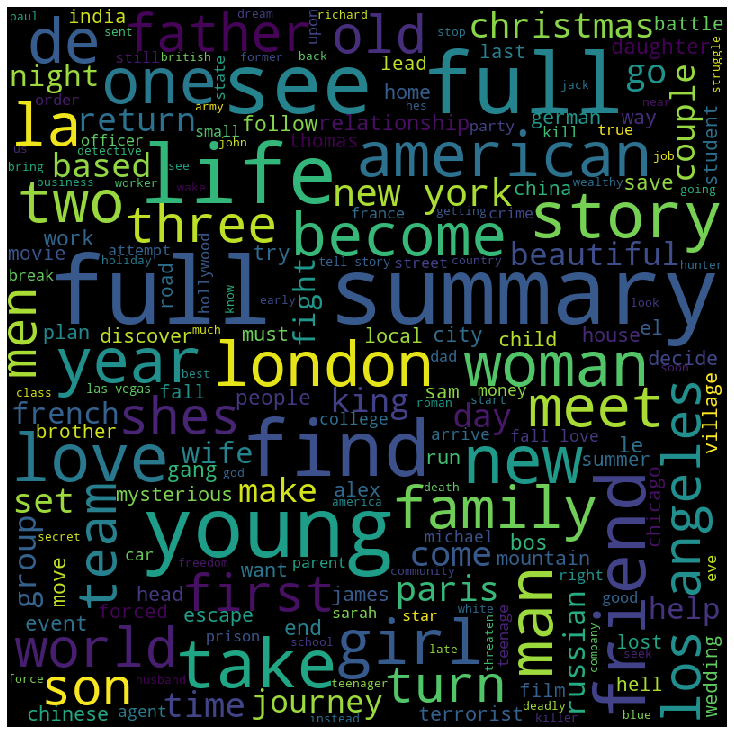

{'full': 51, 'summary': 51, 'see': 46, 'young': 40, 'life': 38, 'find': 34, 'new': 33, 'love': 31, 'story': 28, 'friend': 26, 'take': 25, 'one': 22, 'man': 21, 'girl': 21, 'woman': 21, 'american': 20, 'de': 20, 'year': 20, 'world': 20, 'london': 19}


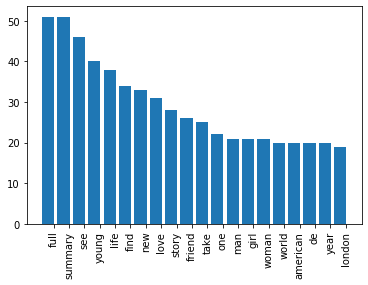

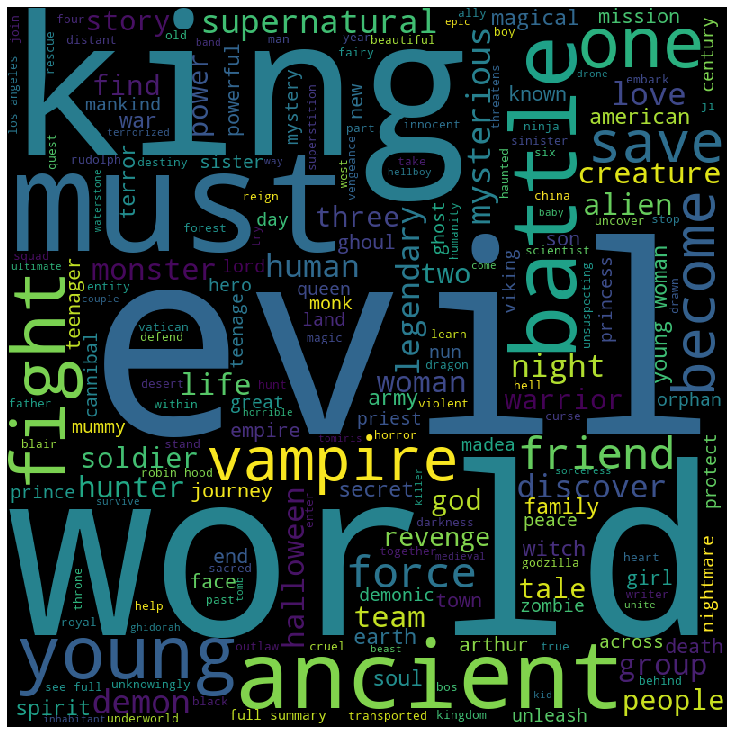

{'evil': 22, 'young': 19, 'world': 17, 'must': 16, 'king': 15, 'ancient': 14, 'woman': 14, 'battle': 13, 'fight': 13, 'one': 12, 'vampire': 12, 'save': 11, 'friend': 11, 'supernatural': 10, 'mysterious': 10, 'demon': 10, 'force': 10, 'human': 9, 'legendary': 9, 'love': 9}


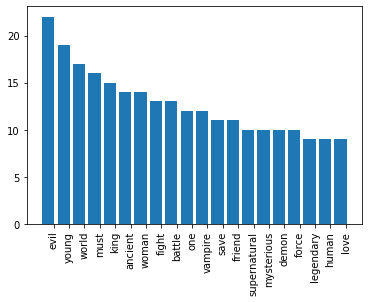

In [75]:
%matplotlib inline
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
from collections import Counter

stop_words = set(STOPWORDS)

for cluster_index in range(0,8):

    key_words = ""

    for index, row in df_bad.iterrows():
        if row['topic_cluster'] == cluster_index:
            separate = row['plot_keywords'].split(" ") 
            for j in range(len(separate)): 
                separate[j] = separate[j].strip().lower()     
            key_words += " ".join(separate)+" "
    
    #print(key_words)
        
    # Creating the Word Cloud
    final_wordcloud = WordCloud(width = 400, height = 400, 
                    background_color ='black', 
                    stopwords = stop_words, 
                    min_font_size = 10).generate(key_words)

    # Displaying the WordCloud                    
    plt.figure(figsize = (10, 10), facecolor = None) 
    plt.imshow(final_wordcloud) 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
  
    plt.show()
    
 
    word_list = key_words.split()
    counts = dict(Counter(word_list).most_common(20))
    print(counts)

    labels, values = zip(*counts.items())

    # sort your values in descending order
    indSort = np.argsort(values)[::-1]

    # rearrange your data
    labels = np.array(labels)[indSort]
    values = np.array(values)[indSort]

    indexes = np.arange(len(labels))

    bar_width = 0.35

    plt.bar(indexes, values)

    # add labels
    plt.xticks(indexes + bar_width, labels, rotation='vertical')
    
    plt.show()


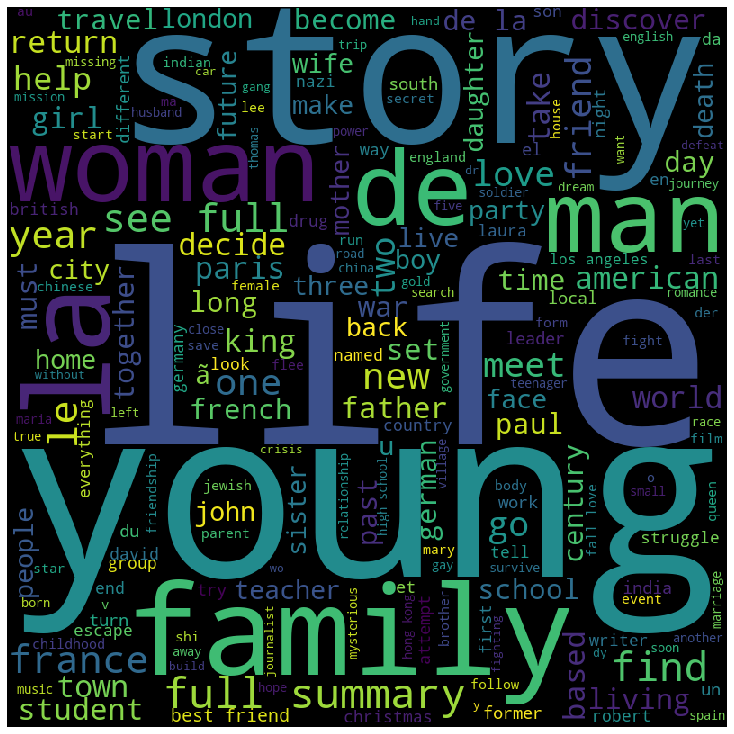

In [17]:
%matplotlib inline
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

stop_words = set(STOPWORDS)
# Creating the Word Cloud
final_wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='black', 
                stopwords = stop_words, 
                min_font_size = 10).generate(key_words)

# Displaying the WordCloud                    
plt.figure(figsize = (10, 10), facecolor = None) 
plt.imshow(final_wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show()

In [ ]:
plt.figure(figsize=(15,10))
country.size().sort_values(ascending=False).plot.bar()
plt.xticks(rotation=50)
plt.xlabel("Country of Origin")
plt.ylabel("Number of Wines")
plt.show()

In [51]:
import nltk

docs_vectors = pd.DataFrame() # creating empty final dataframe
stopwords = nltk.corpus.stopwords.words('english') # removing stop words
for doc in df['text'].str.lower().str.replace('[^a-z ]', ''): # looping through each document and cleaning it
    temp = pd.DataFrame()  # creating a temporary dataframe(store value for 1st doc & for 2nd doc remove the details of 1st & proced through 2nd and so on..)
    for word in doc.split(' '): # looping through each word of a single document and spliting through space
        if word not in stopwords: # if word is not present in stopwords then (try)
            try:
                word_vec = embeddings[word] # if word is present in embeddings(goole provides weights associate with words(300)) then proceed
                temp = temp.append(pd.Series(word_vec), ignore_index = True) # if word is present then append it to temporary dataframe
            except:
                pass
    doc_vector = temp.mean() # take the average of each column(w0, w1, w2,........w300)
    docs_vectors = docs_vectors.append(doc_vector, ignore_index = True) # append each document value to the final dataframe
docs_vectors.shape

(4999, 300)

In [ ]:
headlines_smaller = X_train.sample(frac = 0.2, random_state= 423)
headlines_smaller.columns = ['head_line']

In [35]:
pd.isnull(docs_vectors).sum().sum()

0

In [52]:
docs_vectors['label'] = df['label']


In [53]:
docs_vectors.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,label
0,0.000125,0.015279,0.008926,0.049836,-0.006721,0.037076,0.035643,-0.104678,0.050334,0.161899,0.083093,-0.143872,-0.065053,0.050290,-0.074320,0.083279,0.007044,0.134892,0.043451,-0.026514,0.005012,-0.012401,-0.064835,-0.000161,0.039096,-0.023400,-0.022061,0.049445,0.080436,0.000148,-0.070004,-0.028991,-0.016304,-0.017649,-0.058148,0.008426,0.043686,-0.018324,-0.006134,0.059194,0.048772,-0.036845,0.113261,0.026615,-0.007163,-0.085720,0.063603,0.012560,0.085075,0.026567,-0.034899,0.052307,-0.051398,-0.089528,0.015422,-0.022873,-0.031404,-0.037167,0.032118,-0.017948,-0.000036,0.091783,0.056803,-0.051314,-0.024841,0.015828,-0.021398,0.106174,-0.104804,0.004628,-0.004034,-0.030287,-0.031284,0.005030,-0.192627,-0.025005,0.046722,0.045049,-0.006305,0.071920,0.068448,-0.041990,-0.014181,-0.083635,-0.032657,-0.053742,-0.127942,0.082506,-0.104677,0.067663,-0.005247,-0.027458,-0.075458,0.004371,-0.033844,0.049820,0.046215,-0.036839,0.017144,-0.003937,-0.002088,0.042350,0.050145,-0.077978,0.024683,-0.103743,0.018387,-0.022755,0.022625,-0.088976,-0.065998,0.047682,0.019591,-0.050925,0.081262,-0.085378,-0.063065,0.000836,0.100945,0.122947,-0.100728,-0.014150,-0.000095,-0.038224,0.091278,-0.068589,-0.057115,-0.060594,0.048186,0.087098,-0.037476,-0.099190,-0.077783,0.038170,-0.001280,0.007032,-0.029626,-0.055596,-0.090586,-0.008726,0.049868,0.016724,-0.017005,0.092611,0.007473,0.047363,-0.003030,0.064806,-0.164707,-0.086670,0.141005,-0.056580,-0.047743,0.056978,-0.036106,-0.053407,-0.034248,-0.022489,-0.004400,-0.049154,-0.004259,0.067336,0.048808,0.026123,-0.066576,-0.042701,0.080904,-0.085175,-0.039476,0.030555,0.008497,-0.072883,-0.091161,-0.102929,0.028483,-0.015113,0.003604,-0.025817,-0.046339,-0.000102,-0.048400,-0.029989,0.048507,-0.054593,-0.010849,0.020465,-0.011142,0.063694,0.077844,-0.036933,0.053568,0.026809,0.048109,-0.046248,-0.003147,0.107417,0.001755,0.011210,-0.085063,-0.014262,0.050127,0.110701,-0.022444,-0.076016,0.026321,-0.081548,-0.041609,-0.053302,-0.013619,-0.065002,-0.112454,0.026198,0.022440,0.002306,-0.044745,-0.054376,0.065131,-0.009294,-0.066489,-0.014923,0.058016,0.044378,0.045316,0.045836,0.045047,-0.038917,-0.000626,0.042525,-0.033807,-0.012695,0.054233,0.059785,0.049767,0.056841,0.079127,-0.033016,0.041602,-0.017198,0.075740,0.004588,0.059404,-0.042121,-0.018039,-0.104302,-0.031630,0.002984,0.040924,0.013426,0.025669,-0.129557,0.041723,0.085490,0.094018,0.081757,0.070842,-0.013116,0.034987,-0.047155,0.023215,-0.082222,-0.048103,-0.019884,-0.014594,0.012666,0.050673,0.114095,-0.023141,-0.034424,-0.122009,-0.030821,-0.005751,0.029527,0.017161,0.014553,0.092727,-0.070275,-0.049110,0.036294,0.068264,-0.006466,0.024411,-0.002075,-0.001275,-0.008775,0.023139,0.008122,-0.128740,-0.004910,0.065760,0.026940,-0.029292,-0.052282,-0.072320,0.026530,-0.078797,0.025031,0.002633,-0.080180,-0.003833,0.029297,GOOD
1,0.120792,0.071906,0.052667,0.064106

In [54]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import AdaBoostClassifier

train_x, test_x, train_y, test_y = train_test_split(docs_vectors.drop('label', axis = 1),
                                                   docs_vectors['label'],
                                                   test_size = 0.33,
                                                   random_state = 53)
train_x.shape, train_y.shape, test_x.shape, test_y.shape

((3349, 300), (3349,), (1650, 300), (1650,))

In [55]:
model = AdaBoostClassifier(n_estimators=800, random_state = 1)
model.fit(train_x, train_y)
test_pred = model.predict(test_x)
from sklearn.metrics import accuracy_score
accuracy_score(test_y, test_pred)

0.6

In [ ]:
clf = MultinomialNB(alpha=0.1)

last_score = 0
for alpha in np.arange(0,1,.1):
    nb_classifier = MultinomialNB(alpha=alpha)
    nb_classifier.fit(tfidf_train, y_train)
    pred = nb_classifier.predict(tfidf_test)
    score = metrics.accuracy_score(y_test, pred)
    if score > last_score:
        clf = nb_classifier
    print("Alpha: {:.2f} Score: {:.5f}".format(alpha, score))

In [ ]:
def most_informative_feature_for_binary_classification(vectorizer, classifier, n=100):
    """
    See: https://stackoverflow.com/a/26980472
    
    Identify most important features if given a vectorizer and binary classifier. Set n to the number
    of weighted features you would like to show. (Note: current implementation merely prints and does not 
    return top classes.)
    """

    class_labels = classifier.classes_
    feature_names = vectorizer.get_feature_names()
    topn_class1 = sorted(zip(classifier.coef_[0], feature_names))[:n]
    topn_class2 = sorted(zip(classifier.coef_[0], feature_names))[-n:]

    for coef, feat in topn_class1:
        print(class_labels[0], coef, feat)

    print()

    for coef, feat in reversed(topn_class2):
        print(class_labels[1], coef, feat)


most_informative_feature_for_binary_classification(tfidf_vectorizer, linear_clf, n=30)

In [ ]:
vocab = np.array(tfidf_vectorizer.get_feature_names())

In [ ]:
from sklearn import decomposition

# instantiate the NMF decomposition
nmf = decomposition.NMF(n_components=18, random_state=1)
# get the W and H matrices
W = nmf.fit_transform(tfidf_train)
H = nmf.components_

In [ ]:
def get_top_words(topic, k=10):
    return [vocab[i] for i in np.argsort(topic)[:-k-1:-1]]

def get_topics(matrix, k=10):
    topic_words = ([get_top_words(t, k) for t in matrix])
    return [' '.join(t) for t in topic_words]
  
# get the k most important words for each topic
get_topics(H)

from sklearn.linear_model import PassiveAggressiveClassifier

linear_clf = PassiveAggressiveClassifier(n_iter_no_change=50)
linear_clf.fit(tfidf_train, y_train)
pred = linear_clf.predict(tfidf_test)
score = metrics.accuracy_score(y_test, pred)
print("accuracy:   %0.3f" % score)
print(metrics.classification_report(y_test, pred, labels=['BAD', 'GOOD']))
cm = metrics.confusion_matrix(y_test, pred, labels=['BAD', 'GOOD'])
plot_confusion_matrix(cm, classes=['BAD', 'GOOD'])